In [1]:
%pylab inline
import os
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    pass

def gaussian(x, mu, sig):
    return 1./np.sqrt(2.*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask
if False:
    figMsDir='/work/xiangchong.li/superonionGW/code/massMap_Private/doc/paper_ms_method_HSCY1/'
else:
    figMsDir='/home/xiangchong/.local/code/massMap_Private/doc/paper_ms_method_HSCY1/'

Populating the interactive namespace from numpy and matplotlib


In [9]:
cd wrkDir/sim/

[Errno 2] No such file or directory: 'wrkDir/sim/'
/home/xiangchong/work/gw_ipmu/work/massMapSparse/sim


In [5]:
lnm='nl20'
configName  =   'planck-cosmo/config-pix96-%s.ini' %lnm
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =   cartesianGrid3D(parser)

In [6]:
# Which halo to use
iz  =   2
im  =   7
isim=   52
hdir0='planck-cosmo/pix96-ns10/'
hdir=os.path.join(hdir0,'halo%d%d'%(iz,im))
odir='./' 

outfname0   =  os.path.join(hdir0,'pixsigma-%d%d.fits' %(iz,im))
outfname1   =  os.path.join(hdir,'pixShearR-g1-%d%d-sim%d.fits' %(iz,im,isim))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d%d-sim%d.fits' %(iz,im,isim))
outfname3   =  os.path.join(hdir0,'pixStd.fits')
outfname4   =  os.path.join(hdir0,'lensing_kernel_%s.fits' %lnm )
assert os.path.isfile(outfname0)
assert os.path.isfile(outfname1)
assert os.path.isfile(outfname2)
assert os.path.isfile(outfname3)
assert os.path.isfile(outfname4)

In [7]:
# configuration
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))


# Reconstruction Init
tau=0.
lbd=5.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','2' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)

1.5
planck-cosmo/pix96-ns10/halo27/pixShearR-g2-27-sim52.fits


In [59]:
nmp='f3-1'
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,iz,im))
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.

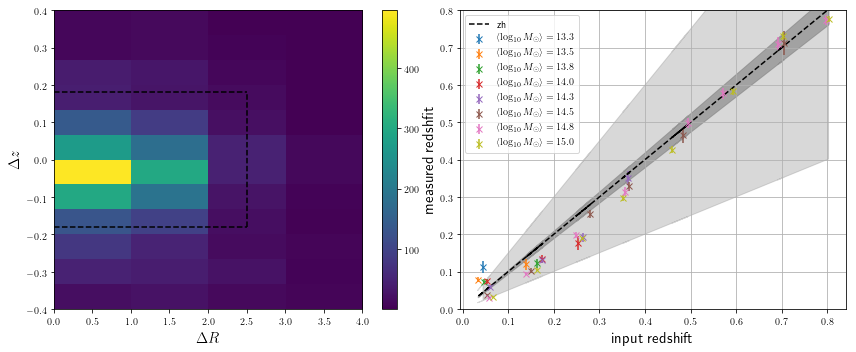

In [61]:
fig=plt.figure(figsize=(12,5))
ax=fig.add_subplot(1,2,1)
hist=np.zeros((4,12))
for i in range(8):
    for j in range(8):
        a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,i,j))
        #a=a[a['value']>0.]
        dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
        dz=a['dZ']
        hist+=np.histogram2d(dr,dz,bins=(4,12),range=((0,4),(-0.4,0.4)),density=False)[0]
plt.imshow(hist.T,origin='lower',aspect='auto',extent=(0,4,-0.4,0.4))
plt.colorbar()
plt.plot(np.linspace(0,2.5,10),np.ones(10)*0.18,'--',c='black')
plt.plot(np.linspace(0,2.5,10),np.ones(10)*-0.18,'--',c='black')
plt.plot(np.ones(10)*2.5,np.linspace(-0.18,0.18,10),'--',c='black')
plt.xlabel(r'$\Delta R$',fontsize=15)
plt.ylabel(r'$\Delta z$',fontsize=15)


ax=fig.add_subplot(1,2,2)
cmap=plt.get_cmap('tab10')
catt=cat[cat['zMea']>0.]
plt.plot(catt['zh'],catt['zh'],'--',c='black',label=None)
for im in range(8):
    if im!=7:
        imm=im
    else:
        imm=im+1
    color=cmap(imm)
    cc=catt[catt['im']==im]
    if len(cc)>0:
        plt.errorbar(cc['zh'],cc['zMea'],cc['zErr']/(np.sqrt(cc['detRat']*100)),fmt='x',c=color,label=r'$\langle \log_{10}M_{\odot} \rangle=%.1f$' %np.average(cc['log10_M200']))
p,cov=np.polyfit(catt['zh'].data,catt['zMea'].data,1,w=1./catt['zErr']*np.sqrt(catt['detRat']*100),cov=True)
erm=np.sqrt(cov[0,0]);erc=np.sqrt(cov[1,1])
#plt.plot(catt['zh'],np.polyval(p,catt['zh']),color='black',ls='-')


plt.fill_between(catt['zh'], 0.95*catt['zh'], 1.05*catt['zh'],color='gray',alpha=0.6)
plt.fill_between(catt['zh'], 0.5*catt['zh'], 1.5*catt['zh'],color='gray',alpha=0.3)
plt.legend(fontsize=10)
plt.tight_layout()
plt.xlabel(r'input redshift',fontsize=15)
plt.ylabel(r'measured redshfit',fontsize=15)
plt.ylim(0.,0.8)
plt.grid()
#plt.savefig(os.path.join(figMsDir,'peak_scatters_f3-1.pdf'))

-0.0012139853679517727
0.09789369110173916
7.835
-0.0022462981674706596
0.09193040956336926
3.771
-0.0044962988615598574
0.08178326685116345
0.78


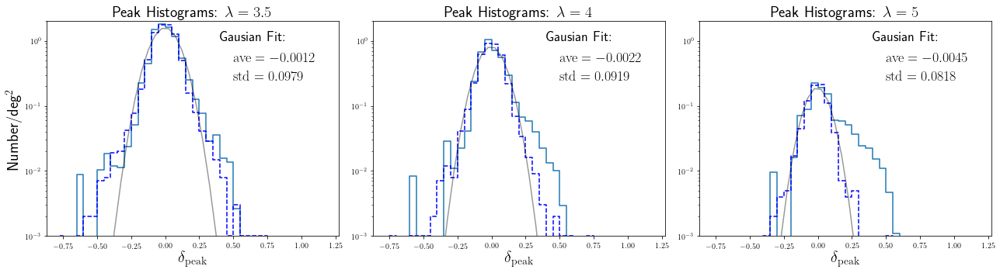

In [58]:
if False:
    weight=np.ones(20)
    minR=-100
    maxR=300
else:
    weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
    minR=-0.8
    maxR=1.2
cmap=plt.get_cmap('tab10')
fig=plt.figure(figsize=(18,5))
nbins=40
iplt=0
pendList=['$\lambda=3.5$','$\lambda=4$','$\lambda=5$']
for nm in ['f3-1','f3-2','f3-3']:
    n=0
    ax=fig.add_subplot(1,3,iplt+1)
    histP=np.zeros(nbins)
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            histP+=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
            n+=1
    grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.step(grids,histP/n/100,'-',c=cmap(izz),where='mid')

    a=pyfits.getdata('planck-cosmo/sparse-%s-2/src-%d%d-alasso2.fits' %(nm,800,800))
    histP=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
    plt.step(grids,histP/10/100,linestyle='--',c='blue',where='mid')
    ave=np.average(a['value']*weight[np.int_(a['iz'])])
    print(ave)
    std=np.std(a['value']*weight[np.int_(a['iz'])])
    print(std)
    amp=np.sum(histP)/1000.
    print(amp)
    gauFit=gaussian(grids,ave,std)*amp
    gauFit=gauFit/np.sum(gauFit)*amp
    plt.plot(grids,gauFit,c='black',alpha=0.4)
    plt.yscale('log')
    plt.ylim(1e-3,2e-0)
    plt.title('Peak Histograms: %s' %pendList[iplt],fontsize=20)
    plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
    plt.text(0.4,1.0,'Gausian Fit:',fontsize=18)
    plt.text(0.5,1./2.,r'$\rm{ave}=%.4f$' %ave,fontsize=18)
    plt.text(0.5,1./4.,r'$\rm{std}=%.4f$' %std,fontsize=18)
    if iplt==0:
        plt.ylabel('Number/deg$^2$',fontsize=20)
    iplt+=1
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

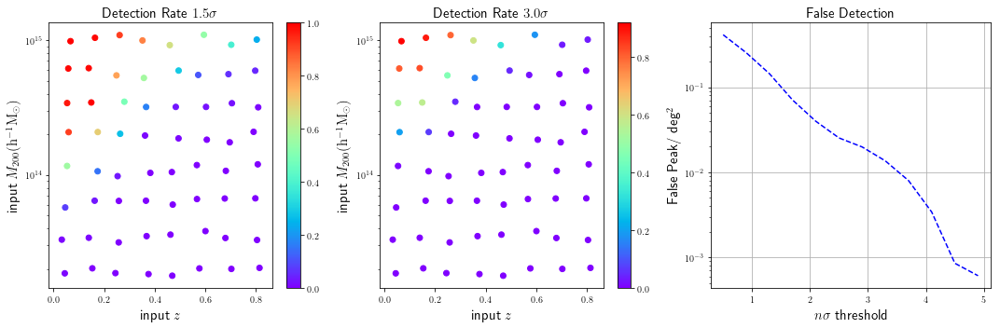

In [47]:
nm='f3-2'
cmap=plt.get_cmap('tab10')
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,3,1)
mu=1.5
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>std*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $1.5\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,2)
mu=3.0
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>std*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $3.0\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,3)
thresList=np.arange(0.5,5.,0.5)
numCLList=[]
numNOList=[]
for thres in thresList:
    numCL=0
    numNO=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            maskC=(a['value']*weight[np.int_(a['iz'])]>thres*0.0776)
            dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
            dz=np.abs(a['dZ'])
            maskT=(dr<=2.5)&(dz<0.18)
            numCL+=np.sum(maskC&maskT)
            numNO+=np.sum(maskC&~maskT)/100./96**2.*60**2./64.
    numCLList.append(numCL)
    numNOList.append(numNO)
plt.plot(thresList,numNOList,ls='--',color='blue')
plt.yscale('log')
plt.title(r'False Detection',fontsize=15)
plt.xlabel(r'$n\sigma$ threshold',fontsize=15)
plt.ylabel('False Peak/ deg$^2$',fontsize=15)
plt.grid()
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'detfalse_threshold.pdf'))

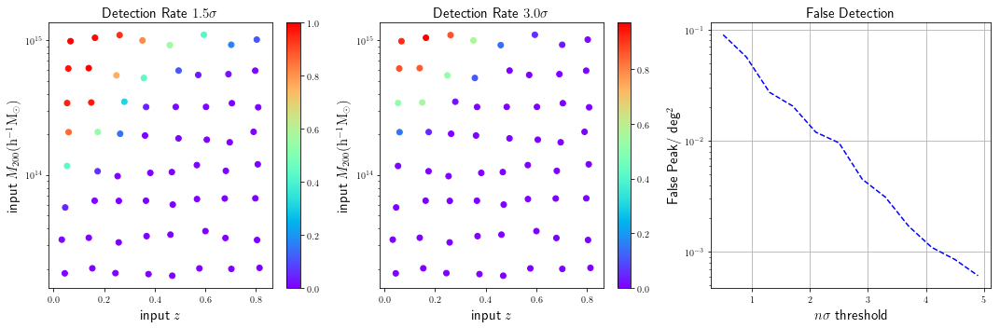

In [48]:
nm='f3-3'
cmap=plt.get_cmap('tab10')
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,3,1)
mu=1.5
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>std*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $1.5\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,2)
mu=3.0
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>std*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $3.0\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,3)
thresList=np.arange(0.5,5.,0.4)
numCLList=[]
numNOList=[]
for thres in thresList:
    numCL=0
    numNO=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            maskC=(a['value']*weight[np.int_(a['iz'])]>thres*0.0776)
            dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
            dz=np.abs(a['dZ'])
            maskT=(dr<=2.5)&(dz<0.18)
            numCL+=np.sum(maskC&maskT)
            numNO+=np.sum(maskC&~maskT)/100./96**2.*60**2./64.
    numCLList.append(numCL)
    numNOList.append(numNO)
plt.plot(thresList,numNOList,ls='--',color='blue')
plt.yscale('log')
plt.title(r'False Detection',fontsize=15)
plt.xlabel(r'$n\sigma$ threshold',fontsize=15)
plt.ylabel('False Peak/ deg$^2$',fontsize=15)
plt.grid()
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'detfalse_threshold.pdf'))

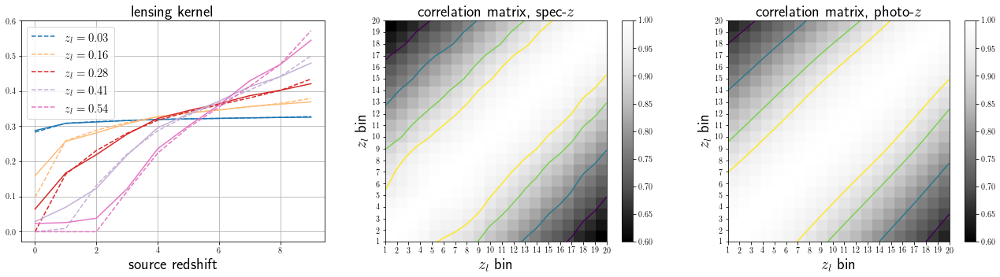

In [37]:
fig=plt.figure(figsize=(18,5)) cmap=plt.get_cmap('tab20') ax=fig.add_subplot(1,3,1)
ax.set_title('lensing kernel', fontsize=20)
lk1=gridInfo.lensing_kernel()
lk2=sparse3D.lensKernel
for izl in range(0,20):
    norm1=np.sqrt(np.sum(lk1[:,izl]**2.))
    norm2=np.sqrt(np.sum(lk2[:,izl]**2.))
    if izl<15 and izl%3==0.:
        ax.plot(lk1[:,izl]/norm1,'--',c=cmap(izl),label=r'$z_l=%.2f$' %gridInfo.zlcgrid[izl])
        ax.plot(lk2[:,izl]/norm2,'-',c=cmap(izl))
    lk1[:,izl]=lk1[:,izl]/norm1
    lk2[:,izl]=lk2[:,izl]/norm2
plt.grid()
ax.set_xlabel(r'source redshift',fontsize=20)
plt.legend(fontsize=15)


ax=fig.add_subplot(1,3,2)
ax.set_title(r'correlation matrix, spec-$z$', fontsize=20)
im=np.array(np.matrix(lk1).T.dot(np.matrix(lk1)))
ax.contour(im.T,extent=[1,20,1,20],cmap='viridis',levels=[0.7, 0.8, 0.9,0.95])
img=ax.imshow(im,origin='lower',vmin=0.6,vmax=1.,cmap='Greys_r',extent=(1,20,1,20))
plt.xticks(range(1,21))
plt.yticks(range(1,21))
ax.set_xlabel(r'$z_l$ bin',fontsize=20)
ax.set_ylabel(r'$z_l$ bin',fontsize=20)
plt.colorbar(img)


ax=fig.add_subplot(1,3,3)
ax.set_title(r'correlation matrix, photo-$z$', fontsize=20)
im=np.array(np.matrix(lk2).T.dot(np.matrix(lk2)))
ax.contour(im.T,extent=[1,20,1,20],cmap='viridis',levels=[0.7, 0.8, 0.9,0.95])
img=ax.imshow(im,origin='lower',vmin=0.6,vmax=1.,cmap='Greys_r',extent=(1,20,1,20))
plt.xticks(range(1,21))
plt.yticks(range(1,21))
ax.set_xlabel(r'$z_l$ bin',fontsize=20)
ax.set_ylabel(r'$z_l$ bin',fontsize=20)
plt.colorbar(img)
plt.tight_layout()

plt.savefig(os.path.join(figMsDir,'lensing_kernel.pdf'))

In [79]:
lk2=sparse3D.lensKernel

In [80]:
lk2.shape

(10, 20)